# Image Generation using Stable Diffusion in Hugging Face Model

This notebook demonstrates image generation using three versions of Stable Diffusion: `v1-4`, `v2-1`, and `SDXL`, along with an optional comparison to `FLUX.1 Schnell`. Stable Diffusion is a state-of-the-art text-to-image model. We will use different prompts to analyze the quality of the images generated by each model.

**Note:** It is highly recommended to run this notebook in Google Colab to utilize a free GPU, which significantly speeds up the process of downloading the models and generating images.

## Step 1: Install and Import Necessary Libraries

First, ensure that you have the required libraries installed. If you haven't installed them yet, uncomment and run the following cell to install the necessary libraries.

In [1]:
! pip install diffusers safetensors

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 20.5 MB/s eta 0:00:00


In [2]:
from diffusers import StableDiffusionPipeline, DiffusionPipeline
import torch
import matplotlib.pyplot as plt
from PIL import Image
import os

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

## Step 2: Initialize the Stable Diffusion Models

We'll load three versions of the Stable Diffusion models: `v1-4`, `v2-1`, and `SDXL`. We'll also check if CUDA (GPU) is available for faster processing. If a GPU is available, it will be utilized.

To avoid memory issues, we will load one model at a time, generate images, and then delete the model from memory.

In [3]:
# Check if CUDA (GPU) is available; otherwise, use CPU
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

# Define a helper function to clear GPU memory
def clear_memory():
    torch.cuda.empty_cache()

# Define the prompts for image generation
prompts = [
    "A bustling futuristic city with flying cars, neon lights, tall skyscrapers, and a sunset in the background",
    "A photorealistic portrait of a young woman wearing a crown made of flowers, standing in a field during golden hour",
    "A digital painting of a mystical forest with glowing mushrooms, magical creatures, and ethereal fog, in the style of fantasy art",
    "A store sign in a small town that says 'Welcome to Dreamland', next to a street with vintage cars and lampposts, in the style of 1960s Americana"
]

Using device: cuda


## Step 3: Generate Images

For each prompt, we will generate an image using each model version (`v1-4`, `v2-1`, and `SDXL`). After each model runs, we will clear the GPU memory before loading the next model to prevent out-of-memory errors.

### Stable Diffusion v1-4

In [4]:
# Initialize the list to store generated images for v1-4
images_v1_4 = []

# Load and run Stable Diffusion v1-4
pipe_v1_4 = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4", torch_dtype=torch.float16).to(device)

# Generate and store images for each prompt
for prompt in prompts:
    image_v1_4 = pipe_v1_4(prompt).images[0]
    images_v1_4.append(image_v1_4)

# Clear GPU memory
clear_memory()

# Delete the pipeline from memory
del pipe_v1_4

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)kpoints/scheduler_config-checkpoint.json:   0%|          | 0.00/209 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.56k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/551 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

### Stable Diffusion v2-1

In [5]:
# Initialize the list to store generated images for v2-1
images_v2_1 = []

# Load and run Stable Diffusion v2-1
pipe_v2_1 = StableDiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-2-1-base", torch_dtype=torch.float16).to(device)

# Generate and store images for each prompt
for prompt in prompts:
    image_v2_1 = pipe_v2_1(prompt).images[0]
    images_v2_1.append(image_v2_1)

# Clear GPU memory
clear_memory()

# Delete the pipeline from memory
del pipe_v2_1

model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/911 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

### Stable Diffusion SDXL

In [6]:
# Initialize the list to store generated images for SDXL
images_sdxl = []

# Load and run Stable Diffusion XL
pipe_sdxl = DiffusionPipeline.from_pretrained("stabilityai/stable-diffusion-xl-base-1.0", torch_dtype=torch.float16, use_safetensors=True, variant="fp16").to(device)

# Generate and store images for each prompt
for prompt in prompts:
    image_sdxl = pipe_sdxl(prompt).images[0]
    images_sdxl.append(image_sdxl)

# Clear GPU memory
clear_memory()

# Delete the pipeline from memory
del pipe_sdxl

model_index.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

Fetching 19 files:   0%|          | 0/19 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/479 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder_2/config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/737 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/5.14G [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

tokenizer_2/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_2/tokenizer_config.json:   0%|          | 0.00/725 [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

## Step 4: Display and Compare Images

Now that we have generated images from all three models, we can display them side by side for comparison.

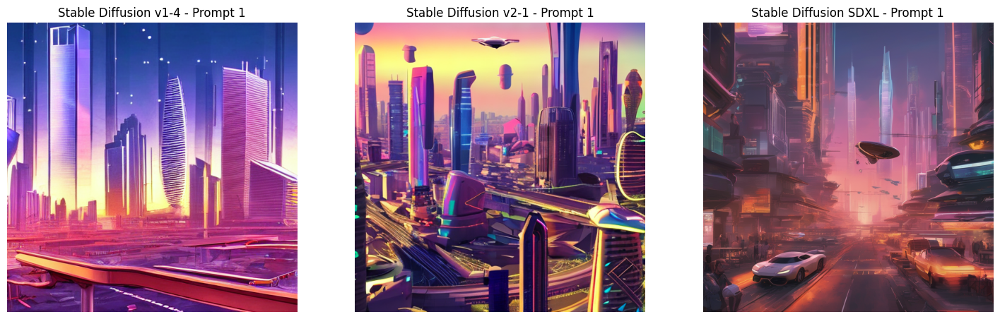

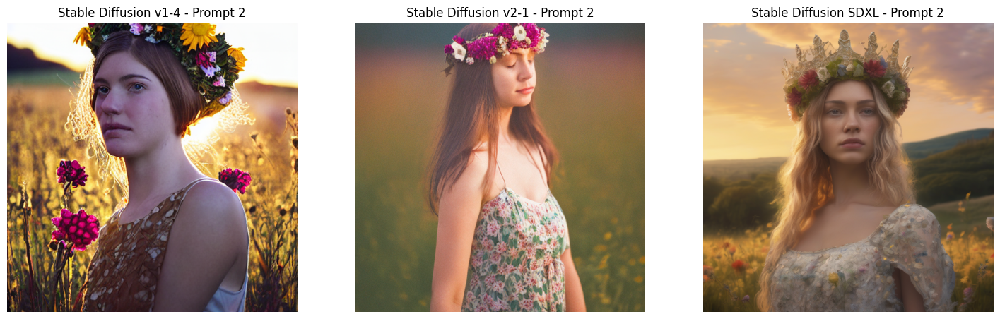

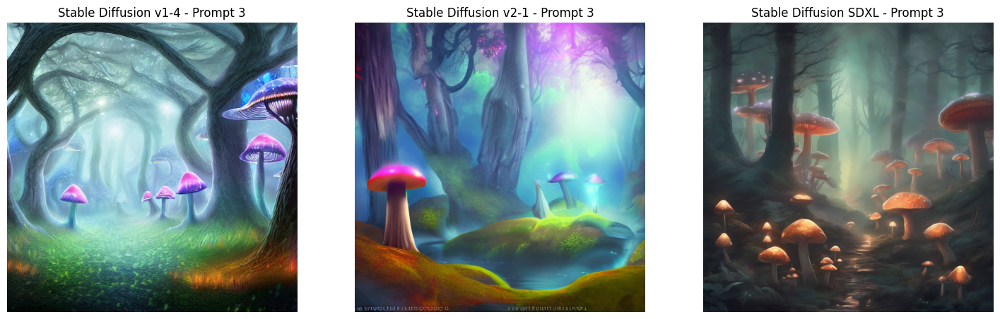

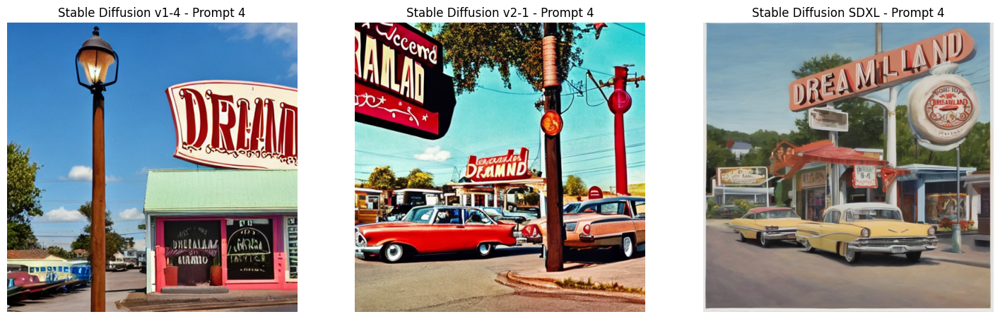

In [7]:
# Compare images side by side
for i, prompt in enumerate(prompts):
    fig, ax = plt.subplots(1, 3, figsize=(18, 6))

    # Show v1-4 image
    ax[0].imshow(images_v1_4[i])
    ax[0].set_title(f'Stable Diffusion v1-4 - Prompt {i+1}')
    ax[0].axis('off')

    # Show v2-1 image
    ax[1].imshow(images_v2_1[i])
    ax[1].set_title(f'Stable Diffusion v2-1 - Prompt {i+1}')
    ax[1].axis('off')

    # Show SDXL image
    ax[2].imshow(images_sdxl[i])
    ax[2].set_title(f'Stable Diffusion SDXL - Prompt {i+1}')
    ax[2].axis('off')

    # Display the images
    plt.show()

### Prompt 1:
- **v1-4**: Generates simple, abstract cityscapes with minimal detail, lacking dynamic elements such as flying cars or intricate neon lighting.
- **v2-1**: Shows significant improvement with more dynamic features like detailed flying cars and complex architecture, creating a livelier scene.
- **SDXL**: Produces the most detailed and realistic image, with refined lighting, shadows, and textures, making the scene highly futuristic and visually rich.

### Prompt 2:
- **v1-4**: Produces a relatively simple, less detailed portrait with a more artificial feel. Lighting and textures are basic, and the flower crown lacks intricacy.
- **v2-1**: Displays improved lighting, softness, and more natural textures. The image appears smoother and more photorealistic, though some details remain simplified.
- **SDXL**: Delivers the most realistic and detailed result, with rich textures, refined lighting, and a highly lifelike portrayal. The scene is immersive and visually polished.

### Prompt 3:
- **v1-4**: The scene has a soft, dreamlike quality with glowing mushrooms and ethereal fog. However, details are blurred, and the composition feels abstract and less refined.
- **v2-1**: Shows improved clarity, vibrant colors, and more defined glowing mushrooms. The scene feels livelier, though some details are still simplified.
- **SDXL**: Produces the most atmospheric rendition, with intricate textures, realistic lighting, and depth. The glowing mushrooms and fog are more immersive, but the scene lacks the magical creatures mentioned in the prompt.

### Prompt 4:
- **v1-4**: Presents a simple, less detailed scene. The vintage feel is conveyed, but the sign and cars appear flat and artificial, lacking depth and realism.
- **v2-1**: Offers a noticeable improvement with vibrant colors and more detailed vintage cars and signs. The 1960s Americana vibe is stronger, but lighting and realism still feel exaggerated.
- **SDXL**: Delivers the most detailed and realistic version, with intricate textures and well-rendered vintage cars. However, the scene lacks proper lighting effects, and some details remain slightly artificial.

## Step 5: Conclusion
From **v1-4** to **v2-1**, there is noticeable but limited improvement in detail and realism. **SDXL** significantly elevates the image quality, delivering more detailed, immersive, and visually rich scenes. However, a few issues remain, such as occasional lack of dynamic lighting or overly artificial details.

---

## Optional: Comparison with FLUX.1 Schnell

`FLUX.1 Schnell` is an open-source text-to-image model released by Black Forest Labs in August 2024. This notebook compares it with Stable Diffusion models. Please ensure the image files from FLUX.1 Schnell are saved in the `image/` directory.

In [14]:
import os

# List all files and folders in the current directory
current_directory = os.getcwd()
files_and_folders = os.listdir(current_directory)

print(f"Current Directory: {current_directory}")
print("Files and Folders:", files_and_folders)

Current Directory: /content
Files and Folders: ['.config', 'image', '.ipynb_checkpoints', 'sample_data']


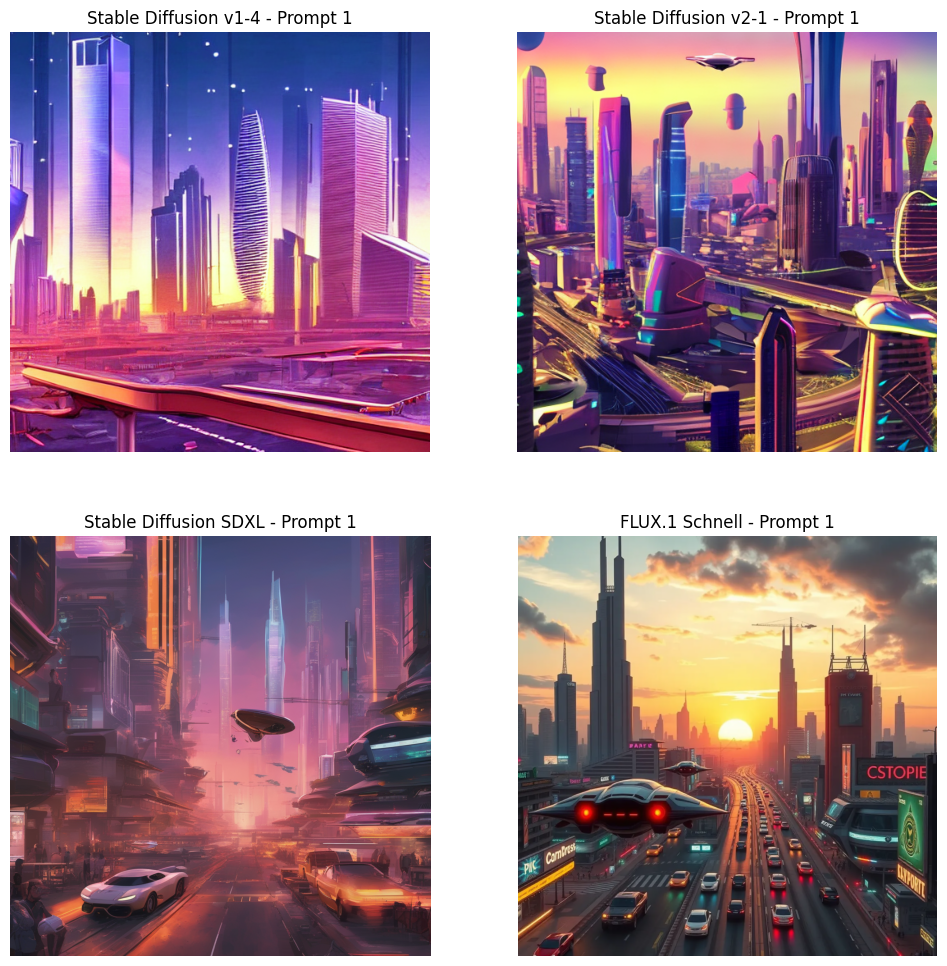

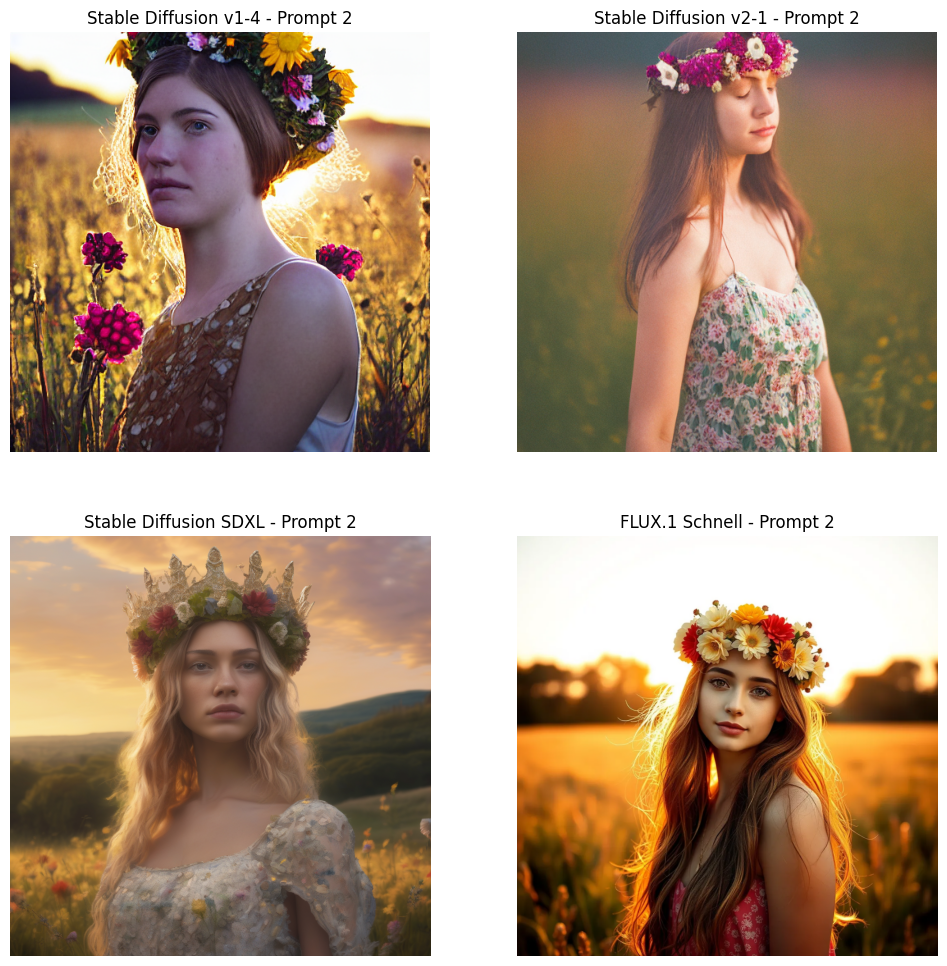

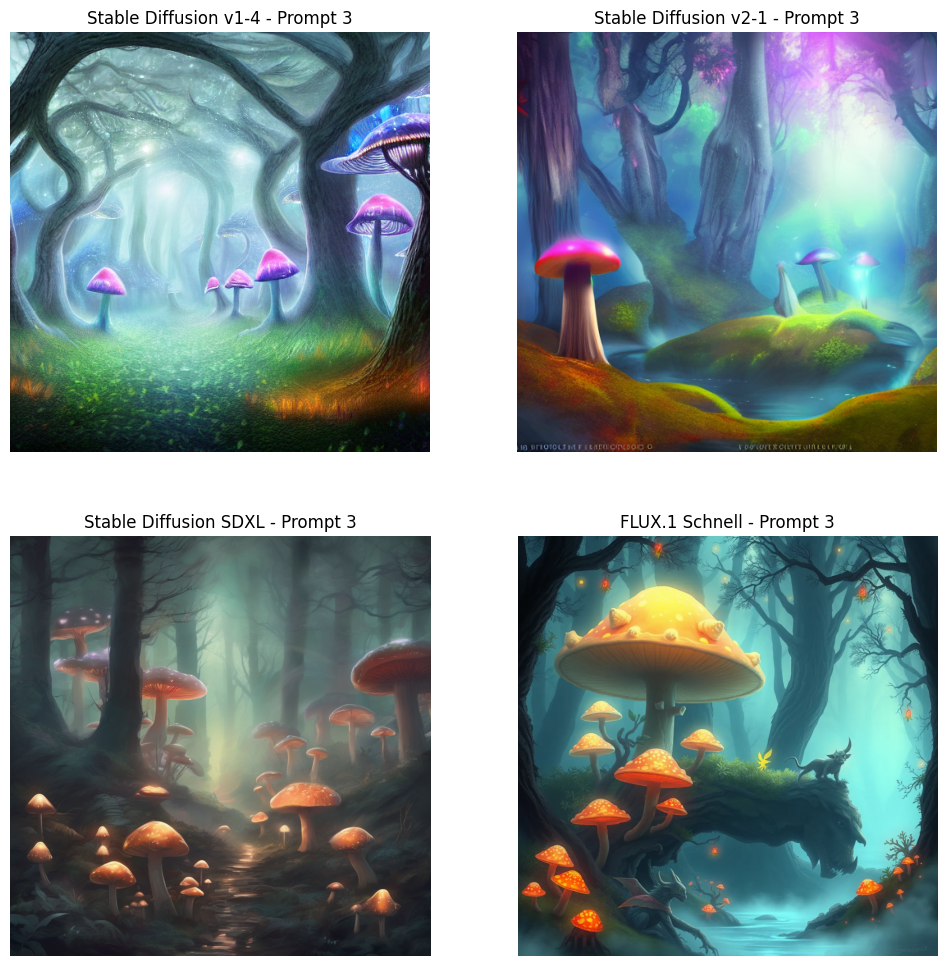

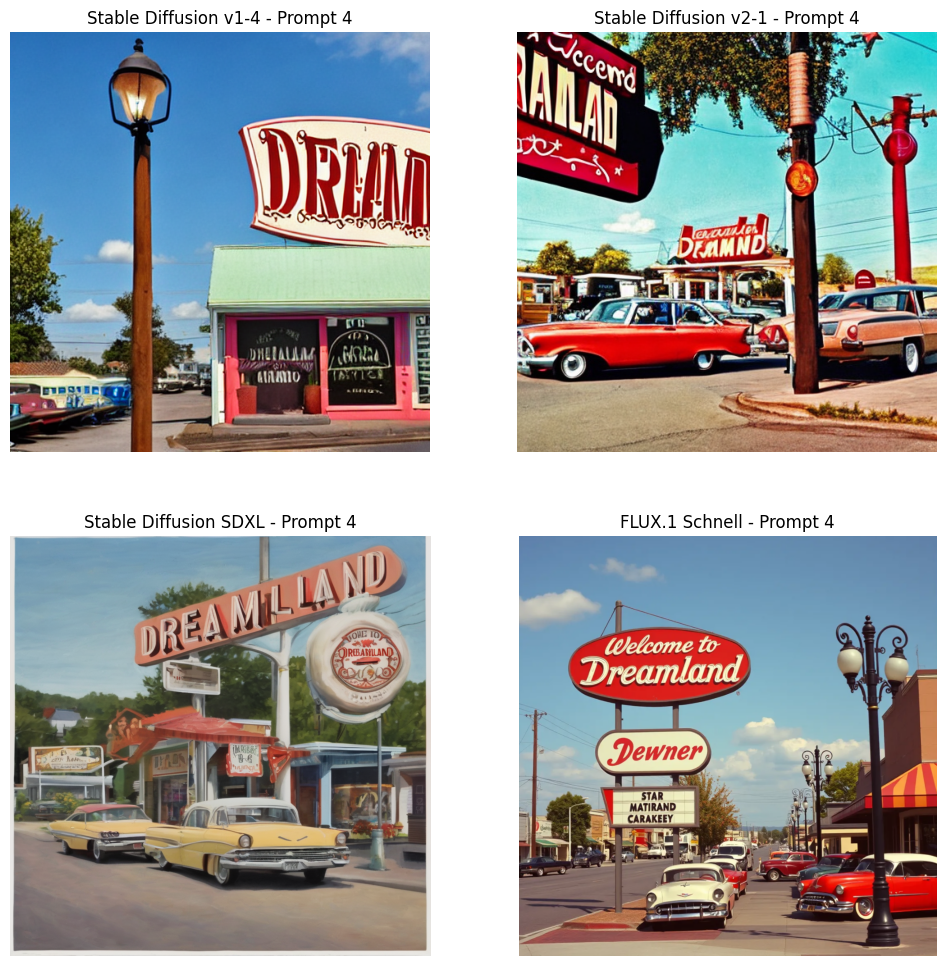

In [12]:
# Image folder paths for FLUX.1 Schnell
image_folder = 'image/'
flux_schnell_prefix = 'FLUX.1_Schnell'

# Display images from all models for comparison
for i, prompt in enumerate(prompts):
    # Load images from folder for FLUX.1 Schnell
    image_flux_schnell = Image.open(os.path.join(image_folder, f'{flux_schnell_prefix}_prompt{i+1}.png'))

    # Create a 2x2 grid to compare images from all models
    fig, ax = plt.subplots(2, 2, figsize=(12, 12))

    # Show v1-4 image
    ax[0, 0].imshow(images_v1_4[i])
    ax[0, 0].set_title(f'Stable Diffusion v1-4 - Prompt {i+1}')
    ax[0, 0].axis('off')

    # Show v2-1 image
    ax[0, 1].imshow(images_v2_1[i])
    ax[0, 1].set_title(f'Stable Diffusion v2-1 - Prompt {i+1}')
    ax[0, 1].axis('off')

    # Show SDXL image
    ax[1, 0].imshow(images_sdxl[i])
    ax[1, 0].set_title(f'Stable Diffusion SDXL - Prompt {i+1}')
    ax[1, 0].axis('off')

    # Show FLUX.1 Schnell image
    ax[1, 1].imshow(image_flux_schnell)
    ax[1, 1].set_title(f'FLUX.1 Schnell - Prompt {i+1}')
    ax[1, 1].axis('off')

    # Display the comparison
    plt.show()

`FLUX.1 Schnell` demonstrates outstanding image quality, generating images that are nearly perfectly aligned with the prompt and, in some cases, exhibiting creative variations.